# Final Project - Deep Learning
#### Classification of histopathology images

<h5>
  <font color="blue">Name: </font>Or Ben - Aba
</h5>
<h5>
  <font color="blue">Name: </font>Inbal Mishal
</h5>

In [1]:
pip install patchify

In [2]:
# External imports
# Deep Learning Modules
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import tensorflow as tf
from tensorflow import keras
import tensorflow_datasets as tfds
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten,Conv2D,MaxPooling2D,Dropout,BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.manifold import TSNE
from patchify import patchify

# Helpers Modules
from urllib.request import urlopen
from io import BytesIO
from zipfile import ZipFile
import shutil
from sklearn.metrics import *
import seaborn
from seaborn import heatmap

# generator
import itertools

# Basic Modules
import os
import math
import numpy as np

In [3]:
# Global constants
img_shape = (150, 150, 3)
batch_size = 32
colors_dict = {'adipose': [64, 224, 208], # turquoise
              'complex': [250, 128, 114], # salmon
              'debris': [147, 112, 219], # mediumpurple
              'empty': [100, 149, 237], # cornflowerblue
              'lympho': [255, 192, 203], # pink
              'mucosa': [0, 139, 139], # darkcyan
              'stroma': [0, 0, 255], # blue
              'tumor': [255, 0, 0] # red
               }
n_classes = 8

#discrete color scheme
cMap = ListedColormap(['red', 'blue', 'darkcyan','pink','cornflowerblue', 'mediumpurple', 'salmon', 'turquoise'])

## General functions

In [4]:
def check_if_file_exists(file_name):
  return os.path.exists(file_name)

def check_if_exists_or_create(dir_name):
  if not os.path.exists(dir_name):
    os.mkdir(dir_name)

# source code
# https://stackoverflow.com/questions/53581278/test-if-notebook-is-running-on-google-colab
if 'google.colab' in str(get_ipython()):
  print('Running on CoLab')
else:
  print('Not running on CoLab')

# Adjusting the project to run both on colab and on other local environments
PREFIX_DOWNLOAD_DIR = ("/content" if 'google.colab' in str(get_ipython()) else "./")

Running on CoLab


<h2>
  <font color="blue">
    Loading the dataset
  </font>
</h2>

### Helper Functions

In [5]:
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >> Source code: https://gist.github.com/hantoine/c4fc70b32c2d163f604a8dc2a050d5f6
# >> @params: url - The URL to download the dataset from
# >>          extarct_to - The path to extarct to
# <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
def download_and_unzip(url, extract_to='.'):
    http_response = urlopen(url)
    zipfile = ZipFile(BytesIO(http_response.read()))
    zipfile.extractall(path=extract_to)

# The datasets zip files can found in:
#  https://github.com/tensorflow/datasets/blob/master/tensorflow_datasets/image_classification/colorectal_histology.py

# if the zip files are already been downloaded or been renamed after zipping
if not (check_if_file_exists("Kather_texture_2016_image_tiles_5000.zip") or check_if_file_exists("Kather_texture_2016_image_tiles_5000")):
  download_and_unzip('https://zenodo.org/record/53169/files/Kather_texture_2016_image_tiles_5000.zip', extract_to='.')

if not (check_if_file_exists("Kather_texture_2016_larger_images_10.zip") or check_if_file_exists("Kather_texture_2016_larger_images_10")):
  download_and_unzip('https://zenodo.org/record/53169/files/Kather_texture_2016_larger_images_10.zip', extract_to='.')
else:
  print("[+] Files are already been downloaded")

In [6]:
def copy_category_files_into_dir(arr_files, dest_dir, category_path, category_name):
  # create the test folder
  for img_name in arr_files:
      source = category_path + img_name
      dest = dest_dir + category_name
      check_if_exists_or_create(dest)
      if not check_if_file_exists(dest + img_name):
        shutil.copy(source, dest)

In [7]:
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >> @params: 
# >>>>>>>>>> arr_category_images: The array of the names of the images in one category
# >>>>>>>>>> category_path: The path to the category folder in the downloaded dataset
# >>>>>>>>>> category_name: The category name
# >>>>>>>>>> test_percent: The part of the test from the dataset in percentage (Must be in range [0, 1])
# >>>>>>>>>> train_percent: The part of the train from the dataset in percentage (Must be in range [0, 1])
# <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
# validation_percent = 1 - test_percent - train-percent
# <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
def split_dataset(arr_category_images, category_path, category_name, test_percent=0.3, train_percent=0.6):
  total_images = len(arr_category_images)

  # Calculating the amount of images in each part in practical
  test_size = math.ceil(test_percent * total_images)
  train_size =  math.ceil(train_percent * total_images)
  validation_size = total_images - test_size - train_size

  # Slicing the original dataset's category images into three parts: train, validation, test
  arr_train_images = arr_category_images[:train_size]
  arr_test_images = arr_category_images[train_size : test_size + train_size]
  arr_validation_images = arr_category_images[test_size + train_size:]

  copy_category_files_into_dir(arr_train_images, train_path, category_path, category_name)
  copy_category_files_into_dir(arr_test_images, test_path, category_path, category_name)
  copy_category_files_into_dir(arr_validation_images, validation_path, category_path, category_name)

In [8]:
# Constants declarations
dataset_path = f"{PREFIX_DOWNLOAD_DIR}/Kather_texture_2016_image_tiles_5000/"
test_path = f"{PREFIX_DOWNLOAD_DIR}/test/"
train_path = f"{PREFIX_DOWNLOAD_DIR}/train/"
validation_path = f"{PREFIX_DOWNLOAD_DIR}/validation/"

# Check if those directories have already been created or otherwise create them
check_if_exists_or_create(test_path)
check_if_exists_or_create(train_path)
check_if_exists_or_create(validation_path)

# Extracting the category's names from /content/Kather_texture_2016_image_tiles_5000/ folder
arr_categories = os.listdir(dataset_path)
for category_name in arr_categories:
  # Filtering only categories file names, because other files/folders might be created such as checkpoint.ipynb
  if category_name[0].isdigit():
    category_path = dataset_path + category_name + '/'
    
    # Getting all the category images of one specific category
    arr_category_images = os.listdir(category_path)
    split_dataset(arr_category_images, category_path, category_name, test_percent=0.3, train_percent=0.6)

In [9]:
train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1./255)

validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_path,
        target_size=(150, 150),
        batch_size=batch_size,
        shuffle=True,
        seed=1,
        class_mode="categorical")

validation_generator = validation_datagen.flow_from_directory(
        validation_path,
        target_size=(150, 150),
        batch_size=batch_size,
        shuffle=True,
        seed=1,
        class_mode="categorical")

test_generator = test_datagen.flow_from_directory(
        test_path,
        target_size=(150, 150),
        batch_size=batch_size,
        shuffle=False,
        class_mode="categorical")

Found 3000 images belonging to 8 classes.
Found 496 images belonging to 8 classes.
Found 1504 images belonging to 8 classes.


In [10]:
# Get dictionary of the labels
categories_txt_to_num = test_generator.class_indices
categories_num_to_txt = {value : key[3:].lower() for (key, value) in categories_txt_to_num.items()}
categories_num_to_txt

{0: 'tumor',
 1: 'stroma',
 2: 'complex',
 3: 'lympho',
 4: 'debris',
 5: 'mucosa',
 6: 'adipose',
 7: 'empty'}

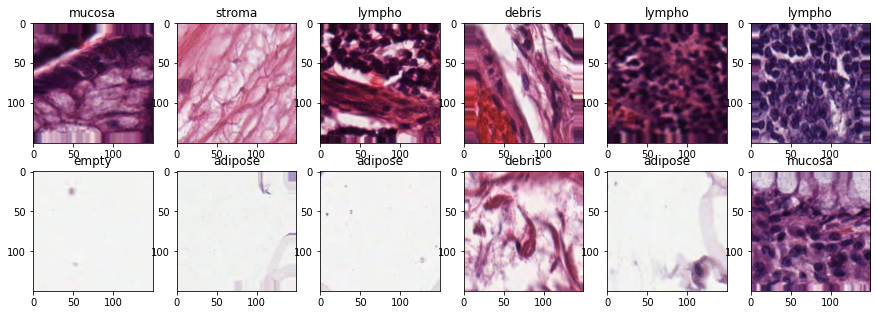

In [11]:
plt.figure(figsize=(15,5))
for i in range(12):
  img, label = train_generator.next()

  plt.subplot(2,6,i+1)
  plt.imshow(img[0])
  plt.title(categories_num_to_txt[np.argmax(label[0])])

plt.show()

## Choosing A Model

In [12]:
# We will name the models with next naming convention:
# model[X], where X is stands for the model number.
# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #
# # # # # # # # Shared code among the models # # # # # # # # 
# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #
# Data augmentation generators
train_augmentator = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=2,
    height_shift_range=2,
    zoom_range=0,
    horizontal_flip=True)

train_generator_aug = train_augmentator.flow_from_directory(
	train_path,
	class_mode="categorical",
	target_size=(150, 150),
	shuffle=True,
	batch_size=batch_size)


validation_augmentator = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=2,
    height_shift_range=2,
    zoom_range=0,
    horizontal_flip=True)


validation_generator_aug = validation_augmentator.flow_from_directory(
	validation_path,
	class_mode="categorical",
	target_size=(150, 150),
	shuffle=True,
	batch_size=batch_size)


# Optimizers
sgd_optimizer = keras.optimizers.SGD(learning_rate=0.0001, momentum=0.9, nesterov=True)
adam_optimizer = keras.optimizers.Adam(learning_rate=0.01)
rms_optimizer = keras.optimizers.RMSprop(learning_rate=0.1)
adagrad_optimizer = keras.optimizers.Adagrad()

Found 3000 images belonging to 8 classes.
Found 496 images belonging to 8 classes.


###**model1 - Basic multy layered CNN**

In [ ]:
# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #
# # # # # # # # # # This model constracts from BatchNormalization and compile with SGD optimizer # # # # # # # # # # # # # 
# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #

model1 = Sequential()
# 32 3x3-Conv2D
model1.add(Conv2D(32, (3, 3), padding='same', input_shape=img_shape))
# 2x2 MaxPooling
model1.add(MaxPooling2D(2, 2))
# 128 3x3-Conv2D
model1.add(Conv2D(128, (3, 3), padding='same'))
# BatchNormalization
model1.add(BatchNormalization())
# 128 3x3-Conv2D
model1.add(Conv2D(128, (3, 3), padding='same'))
# 2x2 MaxPooling
model1.add(MaxPooling2D(2, 2))

model1.add(Flatten())
# 512-Dense
model1.add(Dense(512, activation='relu'))
# 0.5 Dropout
model1.add(Dropout(0.5))

model1.add(Dense(n_classes, activation="softmax"))
model1.summary()

model1.compile(optimizer=sgd_optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model with validation (for tests)
history1 = model1.fit(train_generator, steps_per_epoch=18, epochs=20, validation_data=validation_generator)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 150, 150, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 75, 75, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 75, 75, 128)       36992     
_________________________________________________________________
batch_normalization (BatchNo (None, 75, 75, 128)       512       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 75, 75, 128)       147584    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 37, 37, 128)       0         
_________________________________________________________________
flatten (Flatten)            (None, 175232)            0

###**model2 - Basic + Data Augmentation**

In [ ]:
# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #
# # # # # # # # # # Using the last model but, this time we will use data augmentation over the dataset # # # # # # # # # # 
# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #

model2 = Sequential()
# 32 3x3-Conv2D
model2.add(Conv2D(32, (3, 3), padding='same', input_shape=img_shape))
# 2x2 MaxPooling
model2.add(MaxPooling2D(2, 2))
# 128 3x3-Conv2D
model2.add(Conv2D(128, (3, 3), padding='same'))
# BatchNormalization
model2.add(BatchNormalization())
# 128 3x3-Conv2D
model2.add(Conv2D(128, (3, 3), padding='same'))
# 2x2 MaxPooling
model2.add(MaxPooling2D(2, 2))

model2.add(Flatten())
# 512-Dense
model2.add(Dense(512, activation='relu'))
# 0.5 Dropout
model2.add(Dropout(0.5))

model2.add(Dense(n_classes, activation="softmax"))
model2.summary()


model2.compile(optimizer=sgd_optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model with validation (for tests)
history2 = model2.fit(train_generator_aug, steps_per_epoch=18, epochs=20, validation_data=validation_generator_aug)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 150, 150, 32)      896       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 75, 75, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 75, 75, 128)       36992     
_________________________________________________________________
batch_normalization_1 (Batch (None, 75, 75, 128)       512       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 75, 75, 128)       147584    
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 37, 37, 128)       0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 175232)           

###**model3 - Transfer Learning VGG16 - Adam Optimizer**

In [ ]:
# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #
# # # # # # # # # # Using transfer learning with VGG16 and replace its top with our new trainable model # # # # # # # # # # 
# # # # # # # # # # We will compile the model with Adam optimizer # # # # # # # # # # # # # # # # # # # # # # # # # # # # #
# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #

model3 = Sequential()

vgg16 = tf.keras.applications.VGG16(input_shape=img_shape,
                                               include_top=False, classes=n_classes)
model3.add(vgg16)

model3.add(Flatten())

model3.add(Dense(256, activation='relu'))
model3.add(Dense(8, activation="softmax"))

model3.layers[0].trainable = False

model3.summary()

model3.compile(optimizer=adam_optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history3 = model3.fit(
        train_generator,
        epochs=5,
        validation_data=validation_generator,
        validation_steps=3)

58892288/58889256 [==============================] - 0s 0us/step
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 4, 4, 512)         14714688  
_________________________________________________________________
flatten_2 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 256)               2097408   
_________________________________________________________________
dense_5 (Dense)              (None, 8)                 2056      
Total params: 16,814,152
Trainable params: 2,099,464
Non-trainable params: 14,714,688
_________________________________________________________________
Epoch 1/5
94/94 [==============================] - 24s 213ms/step - loss: 2.1134 - accuracy: 0.6860 - val_loss: 0.5120 - val_accuracy: 0.8333
Epoch 2/5
94/94 [========

###**model4 - Transfer Learning VGG16 - Adagrad Optimizer**

In [ ]:
# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #
# # # # # Using this time in VGG19 the Adagrad optimizer BUT # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # 
# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #

model4 = Sequential()

model4.add(vgg16)

# >>>>> add a new "top": Flatten(), 256-Dense (ReLU), Dropout(0.5), 17-Dense (Softmax) <<<<<
model4.add(Flatten())

model4.add(Dense(256, activation='relu'))
model4.add(Dense(8, activation="softmax"))

# >>>>> freeze the weights in the first layer (of the new model (= the pre-trained VGG16 model) <<<<<
model4.layers[0].trainable = False

model4.summary()

model4.compile(optimizer=adagrad_optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model with validation (for tests)
history4 = model4.fit(
        train_generator,
        steps_per_epoch=18,
        epochs=20,
        validation_data=validation_generator,
        validation_steps=3)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 4, 4, 512)         14714688  
_________________________________________________________________
flatten_3 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dense_6 (Dense)              (None, 256)               2097408   
_________________________________________________________________
dense_7 (Dense)              (None, 8)                 2056      
Total params: 16,814,152
Trainable params: 2,099,464
Non-trainable params: 14,714,688
_________________________________________________________________
Epoch 1/20
18/18 [==============================] - 5s 222ms/step - loss: 1.8855 - accuracy: 0.3177 - val_loss: 1.6882 - val_accuracy: 0.4583
Epoch 2/20
18/18 [==============================] - 4s 197ms/step - loss: 1.5249 - accurac

###**model5 - Transfer Learning (Not frozen weights) VGG19 - SGD Optimizer**

In [ ]:
# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #
# # # # # Using this time in VGG19 the SGD optimizer BUT, this time the weights of the VGG are not frozen # # # # # # # # # 
# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #

model5 = Sequential()

vgg19 = tf.keras.applications.VGG19(input_shape=img_shape,
                                               include_top=False, classes=n_classes)
model5.add(vgg19)

model5.add(Flatten())

model5.add(Dense(256, activation='relu'))
model5.add(Dense(8, activation="softmax"))

model5.layers[0].trainable = True

model5.summary()

model5.compile(optimizer=sgd_optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history5 = model5.fit(
        train_generator,
        steps_per_epoch=(len(train_generator.classes) // 32),
        epochs=11,
        validation_data=validation_generator)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Functional)           (None, 4, 4, 512)         20024384  
_________________________________________________________________
flatten (Flatten)            (None, 8192)              0         
_________________________________________________________________
dense (Dense)                (None, 256)               2097408   
_________________________________________________________________
dense_1 (Dense)              (None, 8)                 2056      
Total params: 22,123,848
Trainable params: 22,123,848
Non-trainable params: 0
_________________________________________________________________
Epoch 1/11
93/93 [==============================] - 69s 343ms/step - loss: 1.2138 - accuracy: 0.5697 - val_loss: 0.6161 - val_accuracy: 0.7762
Epoch 2/11
93/93 [==============================] - 26s 277ms/step - loss: 0.5202 - accuracy: 0.813

###**model6 - Transfer Learning (Not frozen weights) VGG19 - SGD Optimizer & Data Augmentation**

In [13]:
# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #
# # # # # Using this time in VGG19 the SGD optimizer BUT, this time the weights of the VGG are not frozen # # # # # # # # # 
# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #

model6 = Sequential()

vgg19 = tf.keras.applications.VGG19(input_shape=img_shape,
                                               include_top=False, classes=n_classes)
model6.add(vgg19)

model6.add(Flatten())

model6.add(Dense(256, activation='relu'))
model6.add(Dense(8, activation="softmax"))

model6.layers[0].trainable = True

model6.summary()

model6.compile(optimizer=sgd_optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history6 = model6.fit(
        train_generator_aug,
        steps_per_epoch=(len(train_generator_aug.classes) // 32),
        epochs=11,
        validation_data=validation_generator_aug)

80142336/80134624 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Functional)           (None, 4, 4, 512)         20024384  
_________________________________________________________________
flatten (Flatten)            (None, 8192)              0         
_________________________________________________________________
dense (Dense)                (None, 256)               2097408   
_________________________________________________________________
dense_1 (Dense)              (None, 8)                 2056      
Total params: 22,123,848
Trainable params: 22,123,848
Non-trainable params: 0
_________________________________________________________________
Epoch 1/11
93/93 [==============================] - 69s 349ms/step - loss: 1.3676 - accuracy: 0.5350 - val_loss: 0.6850 - val_accuracy: 0.7722
Epoch 2/11
93/93 [================


###**model7 - Fine Tuning**

In [ ]:
# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #
# # # # # Using this time in VGG19 the SGD optimizer BUT, this time the weights of the VGG are not frozen # # # # # # # # # 
# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #
RMSprop_optimizer = keras.optimizers.RMSprop(lr=0.001, rho=0.9, epsilon=1e-08)

model7 = Sequential()

vgg19 = tf.keras.applications.VGG19(input_shape=img_shape,
                                               include_top=False, classes=n_classes)
model7.add(vgg19)

model7.add(Flatten())

model7.add(Dense(256, activation='relu'))
model7.add(Dropout(0.2))
model7.add(Dense(8, activation="softmax"))

model7.layers[0].trainable = False

model7.summary()

model7.compile(optimizer=RMSprop_optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history71 = model7.fit(
        train_generator_aug,
        steps_per_epoch=(len(train_generator_aug.classes) // 32),
        epochs=25,
        validation_data=validation_generator_aug)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Functional)           (None, 4, 4, 512)         20024384  
_________________________________________________________________
flatten_6 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dense_12 (Dense)             (None, 256)               2097408   
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_13 (Dense)             (None, 8)                 2056      
Total params: 22,123,848
Trainable params: 2,099,464
Non-trainable params: 20,024,384
_________________________________________________________________
Epoch 1/25
93/93 [==============================] - 22s 226ms/step - loss: 1.3280 - accuracy: 0.6014

In [ ]:
model7.layers[0].trainable = True

model7.compile(optimizer=sgd_optimizer, # SGD
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history72 = model7.fit(
        train_generator_aug,
        steps_per_epoch=(len(train_generator_aug.classes) // 32),
        epochs=15,
        validation_data=validation_generator_aug)

Epoch 1/15
93/93 [==============================] - 29s 305ms/step - loss: 0.3172 - accuracy: 0.8905 - val_loss: 0.3166 - val_accuracy: 0.9032
Epoch 2/15
93/93 [==============================] - 27s 291ms/step - loss: 0.2255 - accuracy: 0.9191 - val_loss: 0.3333 - val_accuracy: 0.8851
Epoch 3/15
93/93 [==============================] - 28s 301ms/step - loss: 0.2128 - accuracy: 0.9242 - val_loss: 0.2665 - val_accuracy: 0.9173
Epoch 4/15
93/93 [==============================] - 27s 291ms/step - loss: 0.1831 - accuracy: 0.9373 - val_loss: 0.3537 - val_accuracy: 0.8750
Epoch 5/15
93/93 [==============================] - 27s 293ms/step - loss: 0.1546 - accuracy: 0.9424 - val_loss: 0.2963 - val_accuracy: 0.8931
Epoch 6/15
93/93 [==============================] - 28s 294ms/step - loss: 0.1638 - accuracy: 0.9420 - val_loss: 0.3209 - val_accuracy: 0.8992
Epoch 7/15
93/93 [==============================] - 28s 300ms/step - loss: 0.1489 - accuracy: 0.9501 - val_loss: 0.3523 - val_accuracy: 0.8972

## Result

In [ ]:
def test_accuracy(test_generator, model):
  y_true = test_generator.labels
  y_predicted = np.argmax(model.predict(test_generator), axis=1)
  accuracy = sklearn.metrics.accuracy_score(y_true, y_predicted)
  print(f"accuracy = {accuracy}")
  return accuracy

`SO, WHO IS THE BEST ONE? `

In [ ]:
arr_models = [model1, model2, model3, model4, model5, model6, model7]

max_acc = -1
max_index = -1
for (index, model) in enumerate(arr_models):
  print(f"model number {index+1}: ")
  cur_acc =  test_accuracy(test_generator, model)
  if cur_acc > max_acc:
    max_acc, max_index = cur_acc, index


print(f"model{max_index + 1} is the best one!")

model number 1: 
accuracy = 0.6223404255319149
model number 2: 
accuracy = 0.5784574468085106
model number 3: 
accuracy = 0.8457446808510638
model number 4: 
accuracy = 0.78125
model number 5: 
accuracy = 0.8982712765957447
model number 6: 
accuracy = 0.9168882978723404
model number 7: 
accuracy = 0.9069148936170213
model6 is the best one!


`LET'S EXAMINE THE RESULTS:`

<table>
  <tr>
    <th>Model</th>
    <th>#parameters</th>
    <th>epochs</th>
    <th>train accuracy</th>
    <th>validation accuracy</th>
    <th>test accuracy</th>
    <th>Optimizer</th>
    <th>Transfer Learning</th>
    <th>Data Augmentation</th>
    <th>Fine Tuning</th>
  </tr>
    
  <tr> 
    <td>1</td>   <!-- Model -->
    <td>89,909,384 </td> <!-- #parameters -->
    <td>20</td> <!-- epochs -->
    <td>0.6944</td> <!-- train accuracy -->
    <td>0.5806</td> <!-- validation accuracy -->
    <td>0.6223</td> <!-- test accuracy -->
    <td>SGD</td> <!-- Optimizer -->
    <td>X</td> <!-- transfer learning -->
    <td>X</td> <!-- data augmentation -->
    <td>X</td> <!-- Fine Tuning -->
  </tr>
  <tr> 
    <td>2</td>   <!-- Model -->
    <td>89,909,384 </td> <!-- #parameters -->
    <td>20</td> <!-- epochs -->
    <td>0.6701</td> <!-- train accuracy -->
    <td>0.5464</td> <!-- validation accuracy -->
    <td>0.5785</td> <!-- test accuracy -->
    <td>SGD</td> <!-- Optimizer -->
    <td>X</td> <!-- transfer learning -->
    <td>V</td> <!-- data augmentation -->
    <td>X</td> <!-- Fine Tuning -->
  </tr>
  <tr> 
    <td>3</td>   <!-- Model -->
    <td>16,814,152 </td> <!-- #parameters -->
    <td>5</td> <!-- epochs -->
    <td>0.8750</td> <!-- train accuracy -->
    <td>0.8542</td> <!-- validation accuracy -->
    <td>0.8457</td> <!-- test accuracy -->
    <td>ADAM</td> <!-- Optimizer -->
    <td>V</td> <!-- transfer learning -->
    <td>X</td> <!-- data augmentation -->
    <td>X</td> <!-- Fine Tuning -->
  </tr>
  <tr> 
    <td>4</td>   <!-- Model -->
    <td>16,814,152 </td> <!-- #parameters -->
    <td>20</td> <!-- epochs -->
    <td>0.7934</td> <!-- train accuracy -->
    <td>0.7812</td> <!-- validation accuracy -->
    <td>0.7813</td> <!-- test accuracy -->
    <td>AdaGrad</td> <!-- Optimizer -->
    <td>V</td> <!-- transfer learning -->
    <td>X</td> <!-- data augmentation -->
    <td>X</td> <!-- Fine Tuning -->
  </tr>
    <tr> 
    <td>5</td>   <!-- Model -->
    <td>22,123,848 </td> <!-- #parameters -->
    <td>11</td> <!-- epochs -->
    <td>0.9407</td> <!-- train accuracy -->
    <td>0.9052</td> <!-- validation accuracy -->
    <td>0.8983</td> <!-- test accuracy -->
    <td>SGD</td> <!-- Optimizer -->
    <td>V - (Not frozen weights)</td> <!-- transfer learning -->
    <td>X</td> <!-- data augmentation -->
    <td>X</td> <!-- Fine Tuning -->
  </tr>
    <tr> 
    <td>6</td>   <!-- Model -->
    <td>22,123,848 </td> <!-- #parameters -->
    <td>11</td> <!-- epochs -->
    <td>0.9326</td> <!-- train accuracy -->
    <td>0.9274</td> <!-- validation accuracy -->
    <td>0.9169</td> <!-- test accuracy -->
    <td>SGD</td> <!-- Optimizer -->
    <td>V - (Not frozen weights)</td> <!-- transfer learning -->
    <td>V</td> <!-- data augmentation -->
    <td>X</td> <!-- Fine Tuning -->
  </tr>
    <tr> 
    <td>7</td>   <!-- Model -->
    <td>22,123,848 </td> <!-- #parameters -->
    <td>25 + 15</td> <!-- epochs -->
    <td>0.9650</td> <!-- train accuracy -->
    <td>0.9274</td> <!-- validation accuracy -->
    <td>0.907</td> <!-- test accuracy -->
    <td>RMSprop + SGD</td> <!-- Optimizer -->
    <td>V</td> <!-- transfer learning -->
    <td>V</td> <!-- data augmentation -->
    <td>V</td> <!-- Fine Tuning -->
  </tr>
  
</table>


In [17]:
final_model = arr_models[max_index]

`Lets move forward for the next level with the best model`

In [18]:
def display_confusion_matrix(test_generator, batch_size, model):
  labels = test_generator.labels
  # Calculating how much iterations the generator will do
  n_iterations = int(len(labels) / batch_size)

  # empty np arrays
  y_hat = np.array([])
  test_labels = np.array([])
  for i in range(n_iterations):
    # Taking the data of one batch
    imgs, labels = test_generator.next()

    # Classifing with taking the maximum array's index element
    y_hat_batch = np.argmax(model.predict(imgs), axis=1)
    
    # Concatenating the batch result to the main result
    y_hat = np.concatenate((y_hat, y_hat_batch), axis=0)

    labels = np.argmax(labels, axis=1)
    test_labels = np.concatenate((test_labels, labels), axis=0)

  test_labels = test_labels.flatten()

  ### Confusion matrix of the best model
  M = confusion_matrix(test_labels, y_hat)

  CM = M / M.sum(axis=1)
  np.set_printoptions(formatter={'float': '{: 0.3f}'.format})

  plt.figure(figsize=(10,8))
  seaborn.heatmap(CM,cmap='Blues',annot=True, fmt='.2%')
  plt.xlabel('Predicted label', fontsize=20)
  plt.ylabel('True label', fontsize=20)
  plt.show()

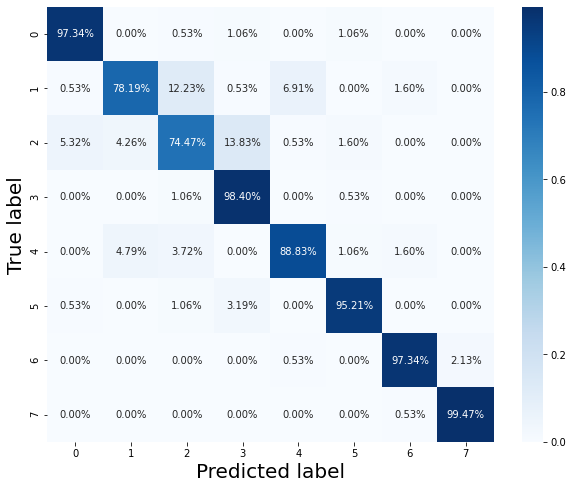

In [19]:
display_confusion_matrix(test_generator, batch_size, final_model)

## Using TSNE - watch the labelled data distribution in 2D

In [20]:
# let's pick the last layer *before* the output
print("last layer *before* the output: ", final_model.layers[-2].name)
print("output shape: ", final_model.layers[-2].output_shape)

features_extractor = keras.Model(inputs=final_model.inputs, outputs=final_model.layers[-2].output)
features_256D = features_extractor.predict(test_generator)
print("features_256D shape: ", features_256D.shape)

last layer *before* the output:  dense
output shape:  (None, 256)
features_256D shape:  (1504, 256)


In [21]:
features_2D = TSNE(n_components=2).fit_transform(features_256D)
features_2D.shape

(1504, 2)

In [22]:
y = test_generator.classes

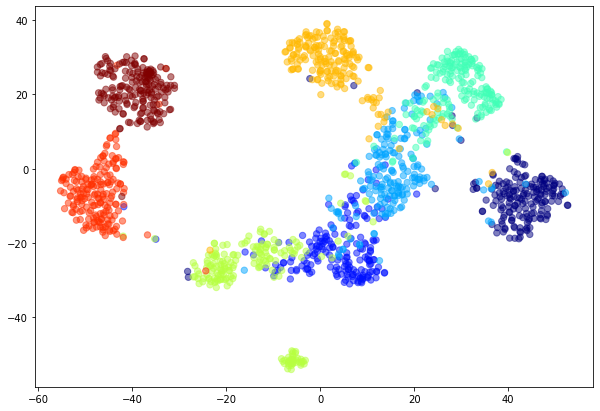

In [23]:
plt.figure(figsize=(10, 7))
plt.scatter(features_2D[:,0], features_2D[:,1], s=40, c=y, 
            cmap='jet', alpha=0.5)

plt.show()

## Classification of each patch in the large images

In [24]:
# upload the large images as a numpy array
big_images_dataset_path = f'{PREFIX_DOWNLOAD_DIR}/Kather_texture_2016_larger_images_10/'
images_names = os.listdir(big_images_dataset_path)
arr_images = []

# load each image and add it to array
for img_name in images_names:
  image = plt.imread(big_images_dataset_path + img_name)
  arr_images.append(image)
  
print('The shape: ',arr_images[0].shape)

The shape:  (5000, 5000, 3)


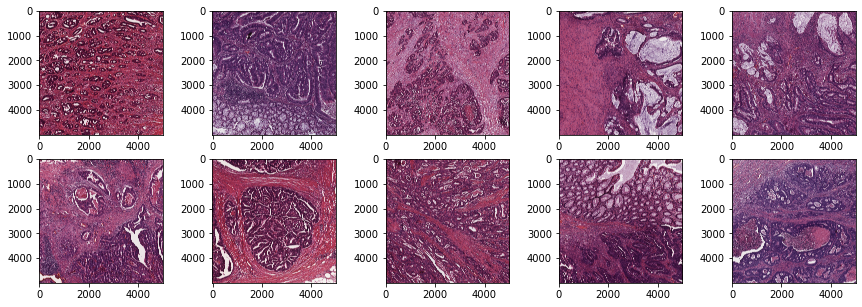

In [25]:
# display the images
plt.figure(figsize=(15,5))
for i, img in enumerate(arr_images):
  plt.subplot(2, 5, i+1)
  plt.imshow(img)
plt.show()

In [26]:
def get_image_after_prediction(image):
  step=50
  num_of_patches = 98
  patch_size = (150, 150, 3)

  # divide into patches with overlapping of 100 pixels
  patches = patchify(image, patch_size, step=step) # shape: (98, 98, 1, 150, 150, 3)
  patches_array = patches.reshape((num_of_patches*num_of_patches*1,150,150,3)) # shape: (9604, 150, 150, 3)
  y_predicted = final_model.predict(patches_array) # shape: (9604, 8)

  # create pad that fulled in 0. this pad represnt the whole image in patches of 50X50  
  pad = np.zeros((100, 100, 8), dtype='float32')

  # create numpy array that represent the number of patches that connected to one part of 50X50
  count = np.zeros((100,100,1))

  # add the prediction result of each patch to it's parts 
  for row in range(num_of_patches): 
    for col in range(num_of_patches):
      patch_idx = num_of_patches * row + col
      patch_value = y_predicted[patch_idx]
      pad[row:row+3, col:col+3, :] += patch_value
      count[row:row+3, col:col+3, 0] += 1

  # create the final img according to the average probability of each part
  final_img = np.zeros_like(image)
  for row in range(100):
    for col in range(100):
      pad[row,col] /= count[row,col]
      category = categories_num_to_txt[np.argmax(pad[row,col])]
      color =  colors_dict[category]
      final_img[row*50:row*50+50, col*50:col*50+50] = color

  return final_img

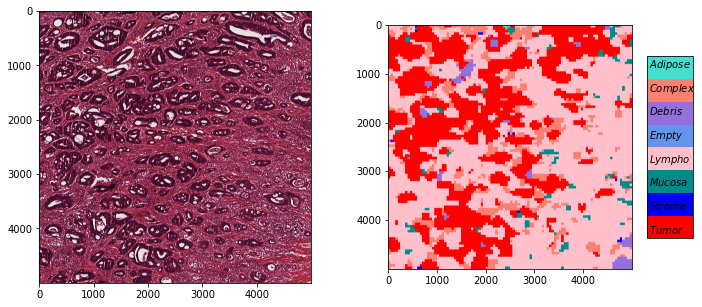

In [27]:
# print the classification result of one large image
img = arr_images[0]
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(img)

new_img = get_image_after_prediction(img)
plt.subplot(1,2,2)
plt.imshow(new_img, cmap=cMap)
cbar = plt.colorbar(aspect = 4)
cbar.ax.get_yaxis().set_ticks([])
for j, lab in enumerate(['$Tumor$','$Stroma$','$Mucosa$','$Lympho$','$Empty$', '$Debris$', '$Complex$', '$Adipose$']):
  cbar.ax.text(10, (530 * j + 100) / 16, lab)

plt.show()

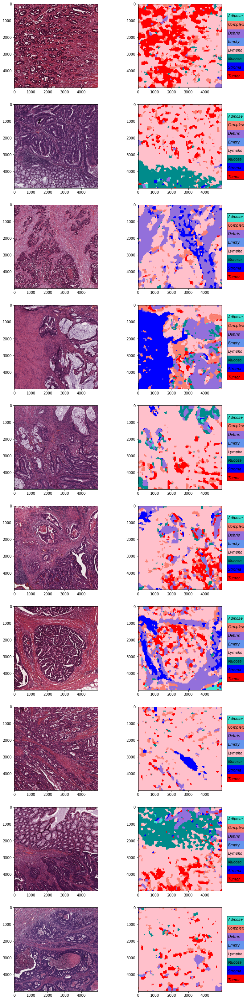

In [28]:
# show the results:
plt.figure(figsize=(12,50))

for i, img in enumerate(arr_images):
  plt.subplot(10, 2, 2*i + 1)
  plt.imshow(arr_images[i])

  plt.subplot(10, 2, 2*i + 2)
  new_img = get_image_after_prediction(img)
  plt.imshow(new_img, cmap=cMap)
  cbar = plt.colorbar(aspect = 4)
  cbar.ax.get_yaxis().set_ticks([])
  for j, lab in enumerate(['$Tumor$','$Stroma$','$Mucosa$','$Lympho$','$Empty$', '$Debris$', '$Complex$', '$Adipose$']):
    cbar.ax.text(10, (530 * j + 100) / 16, lab)

plt.show()

## color each patch using the probability value of "tumor ep"


In [29]:
tumor_idx = 0

In [30]:
def get_image_after_tumor_prediction(image):
  step=50
  num_of_patches = 98
  patch_size = (150, 150, 3)

  # divide into patches with overlapping of 100 pixels
  patches = patchify(image, patch_size, step=step) # shape: (98, 98, 1, 150, 150, 3)
  patches_array = patches.reshape((num_of_patches*num_of_patches*1,150,150,3)) # shape: (9604, 150, 150, 3)
  y_predicted = final_model.predict(patches_array) # shape: (9604, 8)

  # create pad that fulled in 0. this pad represnt the whole image in patches of 50X50  
  pad = np.zeros((100, 100, 8), dtype='float32')

  # create numpy array that represent the number of patches that connected to one part of 50X50
  count = np.zeros((100,100,1))

  # add the prediction result of each patch to it's parts 
  for row in range(num_of_patches): 
    for col in range(num_of_patches):
      patch_idx = num_of_patches * row + col
      patch_value = y_predicted[patch_idx]
      pad[row:row+3, col:col+3, :] += patch_value
      count[row:row+3, col:col+3, 0] += 1


  # create the final img according to the average probability of each part
  final_img = np.zeros((5000, 5000))
  for row in range(100):
    for col in range(100):
      pad[row,col] /= count[row,col]
      y = pad[row,col]
      value = y[tumor_idx]
      final_img[row*50:row*50+50, col*50:col*50+50] = value

  return final_img

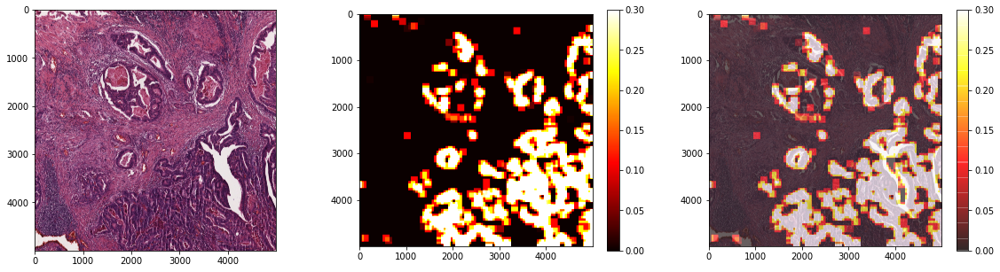

In [40]:
# print the classification result of one large image
plt.figure(figsize=(20,5))

img = arr_images[5]
plt.subplot(1,3,1)
plt.imshow(img)

new_img = get_image_after_tumor_prediction(img)
plt.subplot(1,3,2)
plt.imshow(new_img, cmap='hot', vmin=0 ,vmax=0.3)
plt.colorbar()

# combine the two images into one
plt.subplot(1,3,3)
plt.imshow(img, alpha=0.7)
plt.imshow(new_img, cmap='hot', alpha=0.6, vmin=0 ,vmax=0.3)
plt.colorbar()

plt.show()

`RESOURCES DESTRUCTION (We don't have enough RAM):`


In [41]:
# generators
try:
  del train_augmentator
  del train_datagen
  del train_generator_aug
  del train_generator

  del validation_augmentator
  del validation_datagen
  del validation_generator
  del validation_generator_aug

  # libaries
  del ListedColormap
  del tf
  del keras
  del tfds
  del Sequential
  del Dense, Flatten,Conv2D,MaxPooling2D,Dropout,BatchNormalization
  del ImageDataGenerator
  del TSNE
  del urlopen
  del BytesIO
  del ZipFile
  del shutil
  del seaborn
  del heatmap
  del itertools
  del os
  del math
  
except:
  pass


import gc
gc.collect()

10355

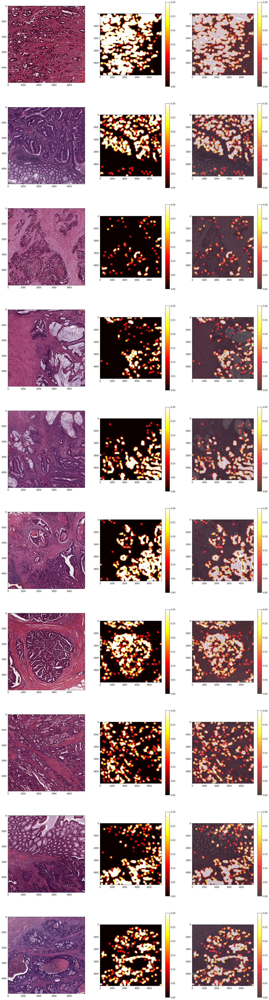

In [42]:
# show the results:
plt.figure(figsize=(23,90))

for i, img in enumerate(arr_images):
  plt.subplot(10, 3, 3*i + 1)
  plt.imshow(img)

  plt.subplot(10, 3, 3*i + 2)
  new_img = get_image_after_tumor_prediction(img)
  plt.imshow(new_img, cmap='hot', vmin=0 ,vmax=0.3)
  plt.colorbar()

  # combine the two images into one
  plt.subplot(10, 3, 3*i + 3)
  plt.imshow(img, alpha=0.7)
  plt.imshow(new_img, cmap='hot', alpha=0.6, vmin=0 ,vmax=0.3)
  plt.colorbar()

  # free resources because we dont have a lot of ram
  del new_img
  del img
  gc.collect()

plt.show()